LiTSpreprocessed_nb_version sẽ chỉ bao gồm model+train và inference, không bao gồm preprocess

Sử dụng dữ liệu trong folder preprocess_data

Check CPU

In [2]:
import os
num_cores = os.cpu_count()
print(f"Số lõi CPU: {num_cores}")

Số lõi CPU: 12


Model + Training

In [1]:
!pip uninstall -y torch torchvision torchaudio
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Found existing installation: torch 2.6.0
Uninstalling torch-2.6.0:
  Successfully uninstalled torch-2.6.0
Found existing installation: torchvision 0.21.0
Uninstalling torchvision-0.21.0:
  Successfully uninstalled torchvision-0.21.0


Looking in indexes: https://download.pytorch.org/whl/cu118
   ---------------------------------------- 0.0/2.7 GB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 GB 14.1 MB/s eta 0:03:15
   ---------------------------------------- 0.0/2.7 GB 21.3 MB/s eta 0:02:08
   ---------------------------------------- 0.0/2.7 GB 18.0 MB/s eta 0:02:31
   ---------------------------------------- 0.0/2.7 GB 22.4 MB/s eta 0:02:02
   ---------------------------------------- 0.0/2.7 GB 22.1 MB/s eta 0:02:03
   ---------------------------------------- 0.0/2.7 GB 21.7 MB/s eta 0:02:05
   ---------------------------------------- 0.0/2.7 GB 21.3 MB/s eta 0:02:07
    --------------------------------------- 0.0/2.7 GB 21.4 MB/s eta 0:02:06
    --------------------------------------- 0.0/2.7 GB 21.4 MB/s eta 0:02:07
    --------------------------------------- 0.0/2.7 GB 20.7 MB/s eta 0:02:10
    --------------------------------------- 0.0/2.7 GB 21.0 MB/s eta 0:02:08
    ---------------------

Epoch [1/100], Train Loss: 0.5968, Valid Loss: 0.4946, Gap: -0.1022, LR: 0.000100
Train Dice: 0.8298, Train Acc: 0.9877 | Valid Dice: 0.8419, Valid Acc: 0.9887
Epoch [2/100], Train Loss: 0.4762, Valid Loss: 0.4181, Gap: -0.0581, LR: 0.000100
Train Dice: 0.8784, Train Acc: 0.9921 | Valid Dice: 0.8568, Valid Acc: 0.9923
Epoch [3/100], Train Loss: 0.4059, Valid Loss: 0.3560, Gap: -0.0499, LR: 0.000100
Train Dice: 0.9027, Train Acc: 0.9939 | Valid Dice: 0.9114, Valid Acc: 0.9937
Epoch [4/100], Train Loss: 0.3555, Valid Loss: 0.3080, Gap: -0.0475, LR: 0.000100
Train Dice: 0.9155, Train Acc: 0.9952 | Valid Dice: 0.9174, Valid Acc: 0.9952
Epoch [5/100], Train Loss: 0.3215, Valid Loss: 0.2842, Gap: -0.0373, LR: 0.000100
Train Dice: 0.9112, Train Acc: 0.9960 | Valid Dice: 0.9014, Valid Acc: 0.9958
Epoch [6/100], Train Loss: 0.2961, Valid Loss: 0.2584, Gap: -0.0377, LR: 0.000100
Train Dice: 0.9282, Train Acc: 0.9964 | Valid Dice: 0.9098, Valid Acc: 0.9964
Epoch [7/100], Train Loss: 0.2809, Valid

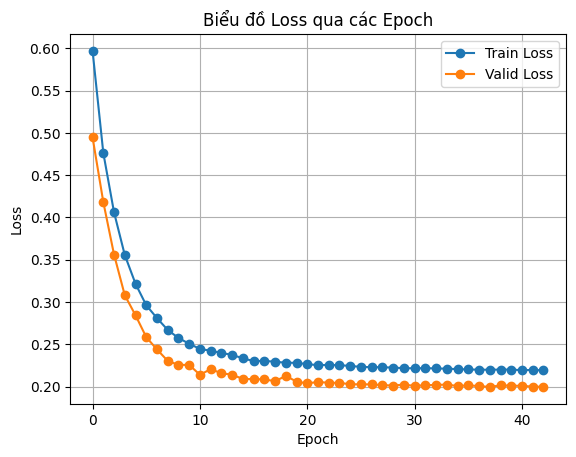

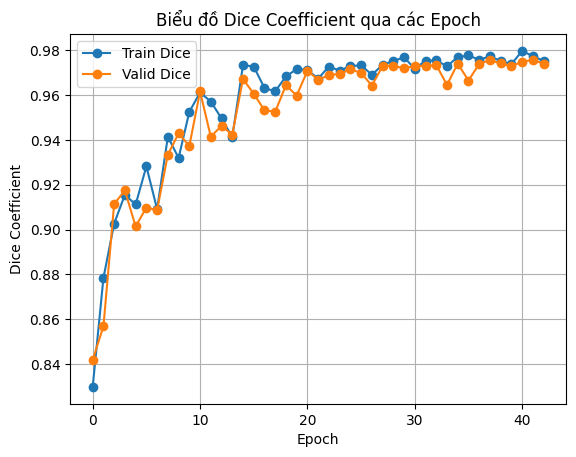

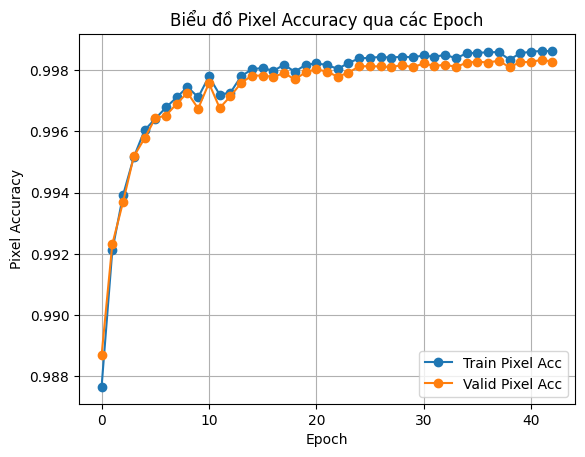

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
import numpy as np
import timm  # Sử dụng backbone PVT từ timm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import cv2
import random
from sklearn.model_selection import train_test_split  # Sử dụng split đơn giản

# ---------------------------------------------------------
# Transform: Augmentation (flip, rotation) và Resize (256x256)
# ---------------------------------------------------------
class AugmentResizeTransform:
    def __init__(self, size=(256, 256), flip_prob=0.5, rotation_range=10):
        """
        size: tuple (width, height) để resize đến.
        flip_prob: xác suất lật ngang.
        rotation_range: biên độ góc xoay ngẫu nhiên (-rotation_range, rotation_range).
        """
        self.size = size
        self.flip_prob = flip_prob
        self.rotation_range = rotation_range

    def __call__(self, image, mask):
        # image, mask có kích thước (1, H, W)
        image_2d = image[0]
        mask_2d = mask[0]

        # Random horizontal flip
        if random.random() < self.flip_prob:
            image_2d = np.fliplr(image_2d)
            mask_2d = np.fliplr(mask_2d)

        # Random rotation
        angle = random.uniform(-self.rotation_range, self.rotation_range)
        (h, w) = image_2d.shape[:2]
        center = (w // 2, h // 2)
        rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        image_2d = cv2.warpAffine(image_2d, rot_matrix, (w, h), flags=cv2.INTER_LINEAR)
        mask_2d = cv2.warpAffine(mask_2d, rot_matrix, (w, h), flags=cv2.INTER_NEAREST)

        # Resize: sử dụng nội suy tuyến tính cho image, nearest cho mask
        image_resized = cv2.resize(image_2d, self.size, interpolation=cv2.INTER_LINEAR)
        mask_resized = cv2.resize(mask_2d, self.size, interpolation=cv2.INTER_NEAREST)

        # Thêm lại kênh: (1, H, W)
        image_resized = np.expand_dims(image_resized, axis=0)
        mask_resized = np.expand_dims(mask_resized, axis=0)

        return image_resized, mask_resized

# ---------------------------------------------------------
# Dataset: Load dữ liệu đã được preprocess từ folder preprocess_data
# ---------------------------------------------------------
class PreprocessedLiverDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        """
        data_dir: folder chứa các file .npz đã được preprocess.
        transform: (tùy chọn) transform để áp dụng augmentation.
        """
        self.data_dir = data_dir
        self.file_list = sorted([f for f in os.listdir(data_dir) if f.endswith(".npz")])
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        try:
            filepath = os.path.join(self.data_dir, self.file_list[idx])
            data = np.load(filepath)
            image = data['image']  # shape: (1, H, W)
            mask = data['mask']    # shape: (1, H, W)

            # Validate data
            if np.isnan(image).any() or np.isinf(image).any():
                raise ValueError(f"Invalid image data in file {filepath}.")
            if np.isnan(mask).any() or np.isinf(mask).any():
                raise ValueError(f"Invalid mask data in file {filepath}.")
            if mask.min() < 0 or mask.max() > 1:
                print(f"Warning: Mask values out of [0,1] in file {filepath}. Clipping performed.")
                mask = np.clip(mask, 0, 1)

            # Apply transformations
            if self.transform is not None:
                image, mask = self.transform(image, mask)

            # Convert to tensors
            image_tensor = torch.from_numpy(image).float()
            mask_tensor = torch.from_numpy(mask).float()
            return image_tensor, mask_tensor
        except Exception as e:
            print(f"Error loading data at index {idx}: {e}")
            raise

# ---------------------------------------------------------
# Model segmentation sử dụng backbone PVT với kiến trúc U-Net style
# ---------------------------------------------------------
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

class UpBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super(UpBlock, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_block = ConvBlock(in_channels + skip_channels, out_channels)
    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[2:] != skip.shape[2:]:
            x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, skip], dim=1)
        return self.conv_block(x)

class PVT_LiverSegImproved(nn.Module):
    def __init__(self, backbone_name="pvt_v2_b2", num_classes=1):
        super(PVT_LiverSegImproved, self).__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True)
        self.encoder_channels = [feat['num_chs'] for feat in self.backbone.feature_info][-3:]
        self.center = ConvBlock(self.encoder_channels[2], 256)
        self.up1 = UpBlock(256, self.encoder_channels[1], 128)
        self.up2 = UpBlock(128, self.encoder_channels[0], 64)
        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.out_conv = nn.Conv2d(64, num_classes, kernel_size=1)
    def forward(self, x):
        B, C, H, W = x.shape
        if C == 1:
            x = x.repeat(1, 3, 1, 1)
        features = self.backbone(x)
        f1 = features[-3]
        f2 = features[-2]
        f3 = features[-1]
        center = self.center(f3)
        d1 = self.up1(center, f2)
        d2 = self.up2(d1, f1)
        d3 = self.up3(d2)
        out = self.out_conv(d3)
        out = F.interpolate(out, size=(H, W), mode='bilinear', align_corners=False)
        return out

# ---------------------------------------------------------
# Hàm tính loss (Dice + BCE)
# ---------------------------------------------------------
def dice_loss(pred, target, smooth=1e-5):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=[2, 3])
    union = pred.sum(dim=[2, 3]) + target.sum(dim=[2, 3])
    dice_coef = (2. * intersection + smooth) / (union + smooth)
    dice_coef = torch.clamp(dice_coef, max=1.0)
    dice = 1 - dice_coef
    return dice.mean()

def bce_loss(pred, target):
    pred = pred.squeeze(1)
    target = target.squeeze(1)
    return nn.functional.binary_cross_entropy_with_logits(pred, target)

def combined_loss(pred, target):
    return 0.5 * dice_loss(pred, target) + 0.5 * bce_loss(pred, target)

# ---------------------------------------------------------
# Hàm evaluate: Tính Dice coefficient và pixel accuracy trên tập dữ liệu
# ---------------------------------------------------------
def evaluate(model, dataloader, device):
    model.eval()
    dice_scores = []
    pixel_accuracies = []
    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)
            preds = torch.sigmoid(outputs)
            preds = (preds > 0.5).float()

            # Tính Dice cho từng batch
            intersection = (preds * masks).sum(dim=[2,3])
            union = preds.sum(dim=[2,3]) + masks.sum(dim=[2,3])
            dice = (2. * intersection + 1e-5) / (union + 1e-5)
            dice_scores.append(dice.mean().item())

            # Tính pixel accuracy
            correct = (preds == masks).float().sum()
            total = torch.numel(preds)
            pixel_accuracy = correct / total
            pixel_accuracies.append(pixel_accuracy.item())
    avg_dice = np.mean(dice_scores)
    avg_accuracy = np.mean(pixel_accuracies)
    return avg_dice, avg_accuracy

# ---------------------------------------------------------
# Hàm evaluate_loss: Tính loss trên tập dữ liệu
# ---------------------------------------------------------
def evaluate_loss(model, dataloader, device):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)
            outputs = model(images)
            loss = combined_loss(outputs, masks)
            total_loss += loss.item()
    return total_loss / len(dataloader)

# ---------------------------------------------------------
# Early Stopping dựa trên validation loss
# ---------------------------------------------------------
class EarlyStopping:
    def __init__(self, patience=5, min_delta=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = None
        self.counter = 0
    def step(self, loss):
        if self.best_loss is None:
            self.best_loss = loss
            return False
        elif self.best_loss - loss > self.min_delta:
            self.best_loss = loss
            self.counter = 0
            return False
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
            return False

# ---------------------------------------------------------
# Vòng lặp train cho một epoch
# ---------------------------------------------------------
def train_one_epoch(model, dataloader, optimizer, device):
    model.train()
    total_loss = 0.0
    for batch_idx, (images, masks) in enumerate(dataloader):
        images = images.to(device)
        masks = masks.to(device)
        if torch.isnan(images).any() or torch.isinf(images).any():
            print(f"WARNING: Invalid image tensor in batch {batch_idx}")
        if torch.isnan(masks).any() or torch.isinf(masks).any():
            print(f"WARNING: Invalid mask tensor in batch {batch_idx}")
        optimizer.zero_grad()
        outputs = model(images)
        loss = combined_loss(outputs, masks)
        if loss.item() < 0:
            print(f"WARNING: Negative loss encountered in batch {batch_idx}! Loss: {loss.item():.6f}")
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dataloader)

# ---------------------------------------------------------
# Main: Sử dụng một validation set để đánh giá hiệu năng, overfitting và vẽ các đồ thị metric
# ---------------------------------------------------------
def main():
    # Tham số huấn luyện
    batch_size = 2
    lr = 1e-4
    num_epochs = 100
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Folder chứa file .npz đã được preprocess
    data_dir = "preprocess_data"  # Not Colab
    # data_dir = "/content/drive/MyDrive/preprocess_data"  # Colab
    transform = AugmentResizeTransform(size=(256, 256), flip_prob=0.5, rotation_range=10)
    dataset = PreprocessedLiverDataset(data_dir, transform=transform)

    # Tách dữ liệu thành train và validation (80/20)
    indices = list(range(len(dataset)))
    train_indices, valid_indices = train_test_split(indices, test_size=0.2, random_state=42, shuffle=True)
    train_subset = Subset(dataset, train_indices)
    valid_subset = Subset(dataset, valid_indices)
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
    valid_loader = DataLoader(valid_subset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)

    # Khởi tạo mô hình, optimizer, scheduler và early stopping dựa trên validation loss
    model = PVT_LiverSegImproved(backbone_name="pvt_v2_b2", num_classes=1).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5)
    early_stopper = EarlyStopping(patience=5, min_delta=1e-4)

    # Danh sách lưu lại các metric qua từng epoch
    train_losses = []
    valid_losses = []
    train_dice_list = []
    train_acc_list = []
    valid_dice_list = []
    valid_acc_list = []

    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, train_loader, optimizer, device)
        valid_loss = evaluate_loss(model, valid_loader, device)
        scheduler.step(valid_loss)
        current_lr = optimizer.param_groups[0]['lr']

        avg_dice_train, avg_acc_train = evaluate(model, train_loader, device)
        avg_dice_valid, avg_acc_valid = evaluate(model, valid_loader, device)

        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_dice_list.append(avg_dice_train)
        train_acc_list.append(avg_acc_train)
        valid_dice_list.append(avg_dice_valid)
        valid_acc_list.append(avg_acc_valid)

        # Tính hiệu số loss giữa train và validation để theo dõi overfitting
        loss_gap = valid_loss - train_loss

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Gap: {loss_gap:.4f}, LR: {current_lr:.6f}")
        print(f"Train Dice: {avg_dice_train:.4f}, Train Acc: {avg_acc_train:.4f} | Valid Dice: {avg_dice_valid:.4f}, Valid Acc: {avg_acc_valid:.4f}")

        if loss_gap > 0.05:
            print("Warning: Hiệu số loss giữa train và valid khá lớn, có thể mô hình đang overfitting!")

        if early_stopper.step(valid_loss):
            print("Early stopping triggered!")
            break

    # Lưu mô hình cuối cùng
    os.makedirs("weights", exist_ok=True) # Not colab
    save_path = "weights/pvt_liver_seg_preprocess.pth" # Not colab
    # save_path = "pvt_liver_seg_preprocess.pth" # Colab
    torch.save(model.state_dict(), save_path)
    print(f"Đã lưu mô hình tại {save_path}")

    # Vẽ đồ thị Loss cho train và validation
    plt.figure()
    plt.plot(train_losses, marker='o', label='Train Loss')
    plt.plot(valid_losses, marker='o', label='Valid Loss')
    plt.title("Biểu đồ Loss qua các Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.savefig("loss_plot.png")
    plt.show()

    # Vẽ đồ thị Dice coefficient cho train và validation
    plt.figure()
    plt.plot(train_dice_list, marker='o', label='Train Dice')
    plt.plot(valid_dice_list, marker='o', label='Valid Dice')
    plt.title("Biểu đồ Dice Coefficient qua các Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Dice Coefficient")
    plt.legend()
    plt.grid(True)
    plt.savefig("dice_plot.png")
    plt.show()

    # Vẽ đồ thị Pixel Accuracy cho train và validation
    plt.figure()
    plt.plot(train_acc_list, marker='o', label='Train Pixel Acc')
    plt.plot(valid_acc_list, marker='o', label='Valid Pixel Acc')
    plt.title("Biểu đồ Pixel Accuracy qua các Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Pixel Accuracy")
    plt.legend()
    plt.grid(True)
    plt.savefig("pixel_acc_plot.png")
    plt.show()

if __name__ == "__main__":
    main()


Dự đoán Test

e:\LS\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


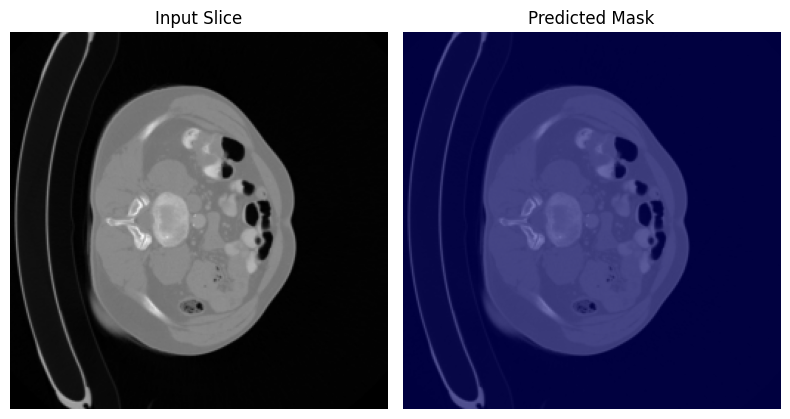

Đã lưu kết quả dự đoán cho test-volume-0.nii tại plots\pred_test-volume-0.nii.png


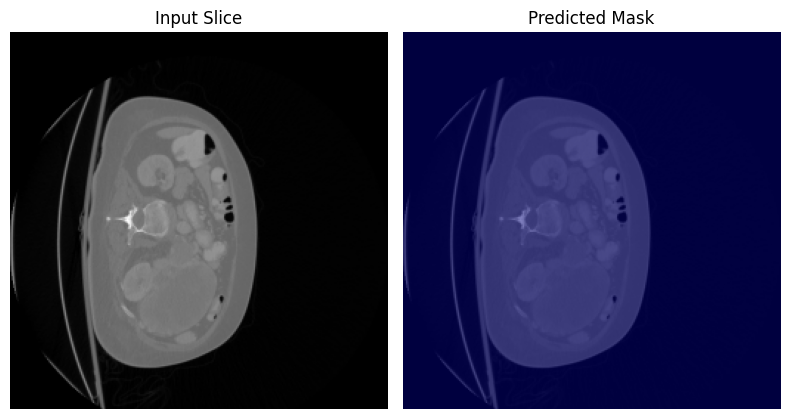

Đã lưu kết quả dự đoán cho test-volume-1.nii tại plots\pred_test-volume-1.nii.png


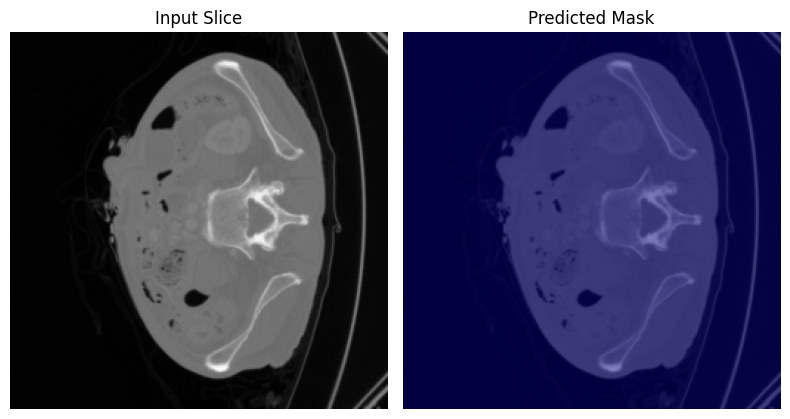

Đã lưu kết quả dự đoán cho test-volume-10.nii tại plots\pred_test-volume-10.nii.png


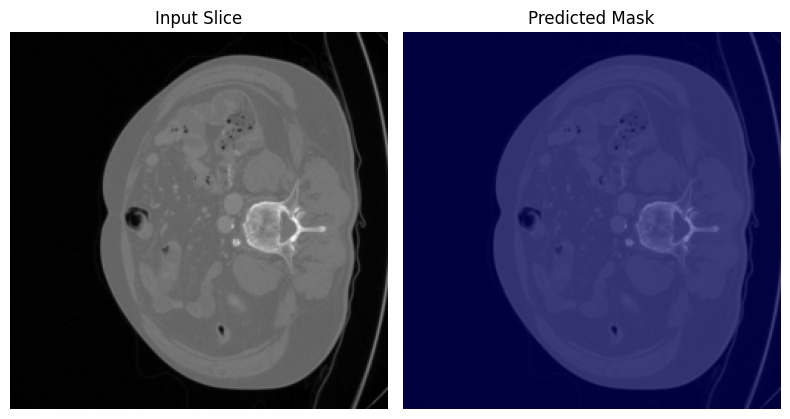

Đã lưu kết quả dự đoán cho test-volume-11.nii tại plots\pred_test-volume-11.nii.png


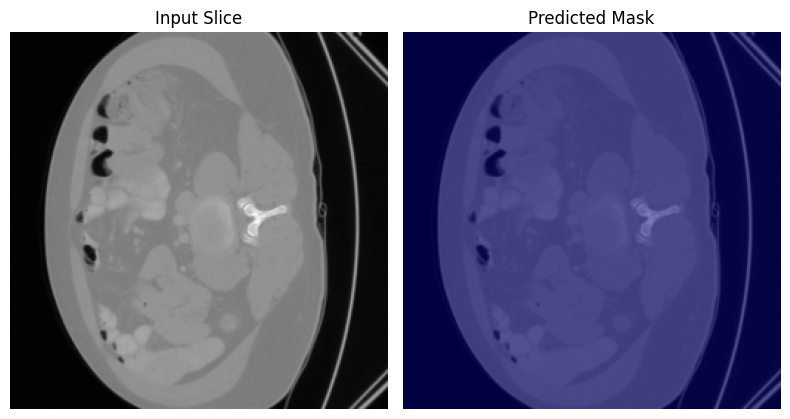

Đã lưu kết quả dự đoán cho test-volume-12.nii tại plots\pred_test-volume-12.nii.png


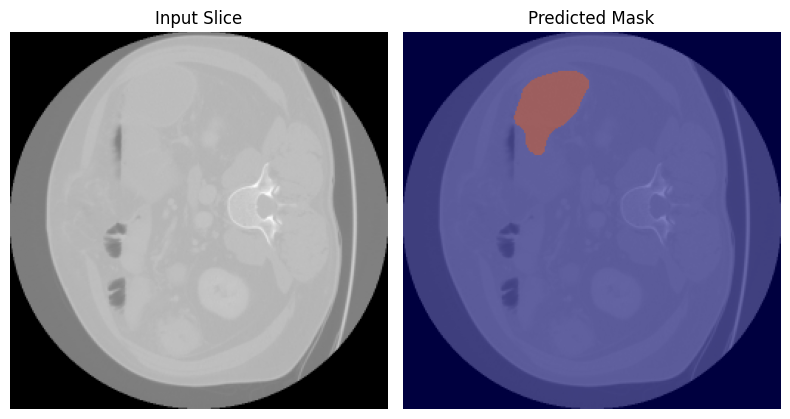

Đã lưu kết quả dự đoán cho test-volume-13.nii tại plots\pred_test-volume-13.nii.png


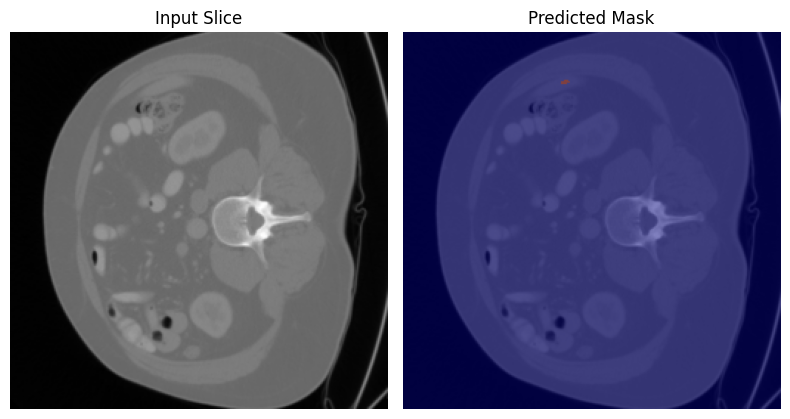

Đã lưu kết quả dự đoán cho test-volume-14.nii tại plots\pred_test-volume-14.nii.png


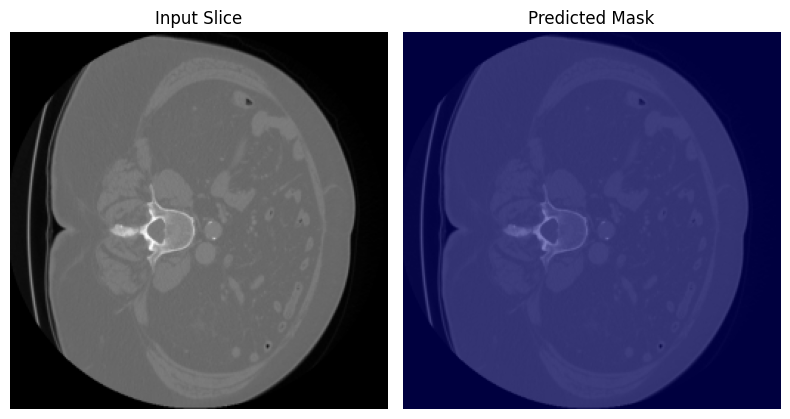

Đã lưu kết quả dự đoán cho test-volume-15.nii tại plots\pred_test-volume-15.nii.png


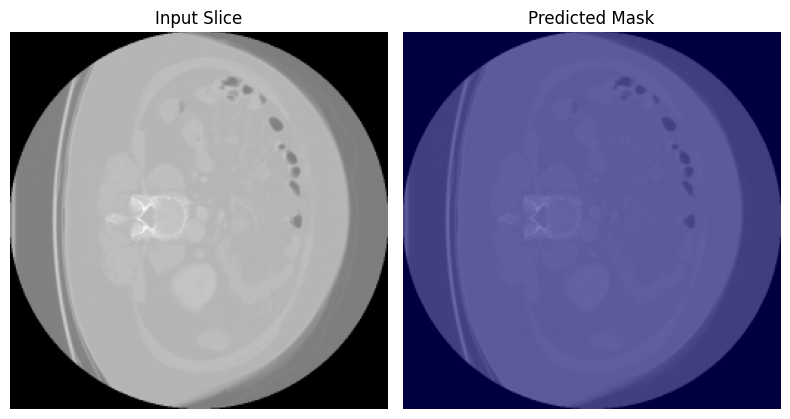

Đã lưu kết quả dự đoán cho test-volume-16.nii tại plots\pred_test-volume-16.nii.png


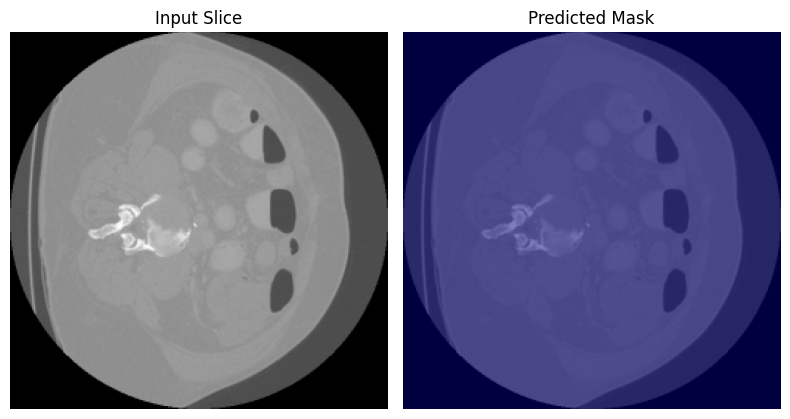

Đã lưu kết quả dự đoán cho test-volume-17.nii tại plots\pred_test-volume-17.nii.png


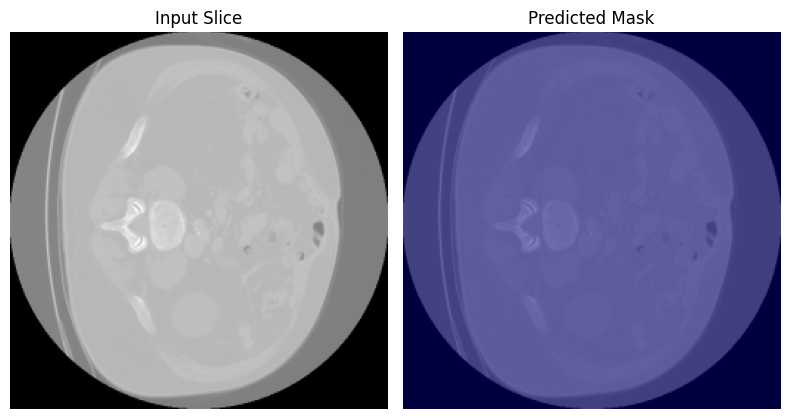

Đã lưu kết quả dự đoán cho test-volume-18.nii tại plots\pred_test-volume-18.nii.png


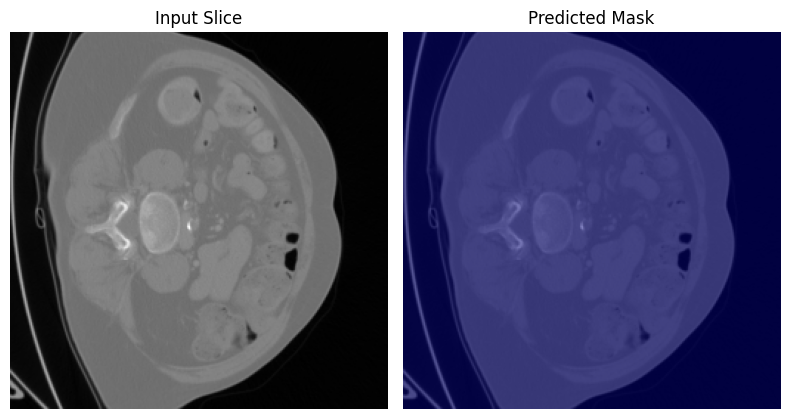

Đã lưu kết quả dự đoán cho test-volume-19.nii tại plots\pred_test-volume-19.nii.png


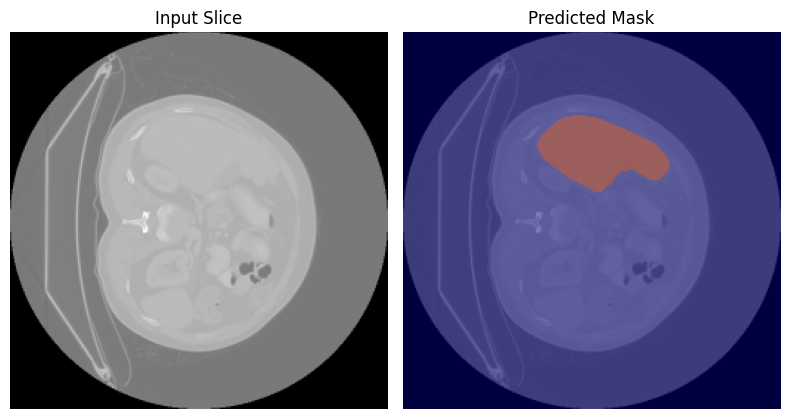

Đã lưu kết quả dự đoán cho test-volume-2.nii tại plots\pred_test-volume-2.nii.png


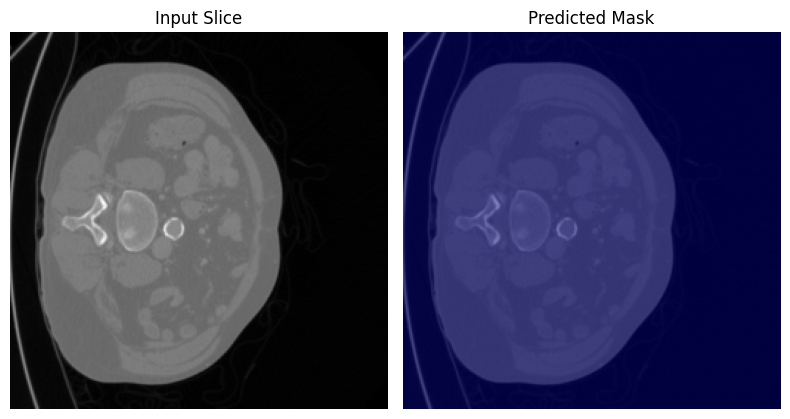

Đã lưu kết quả dự đoán cho test-volume-20.nii tại plots\pred_test-volume-20.nii.png


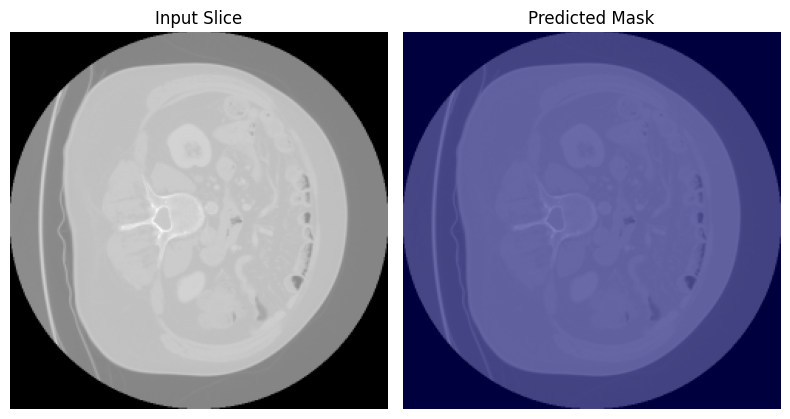

Đã lưu kết quả dự đoán cho test-volume-21.nii tại plots\pred_test-volume-21.nii.png


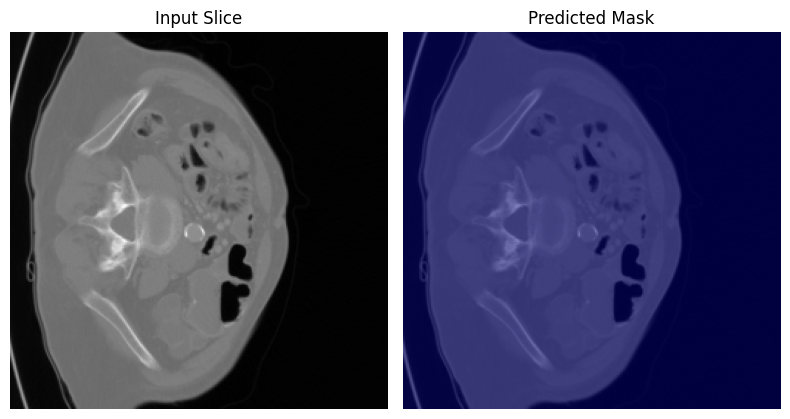

Đã lưu kết quả dự đoán cho test-volume-22.nii tại plots\pred_test-volume-22.nii.png


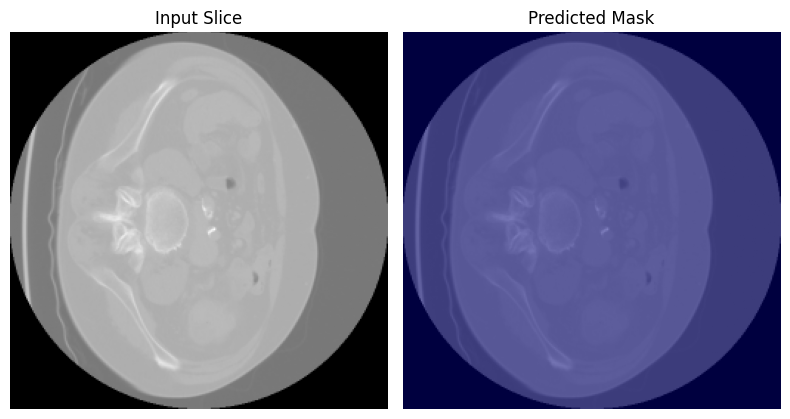

Đã lưu kết quả dự đoán cho test-volume-23.nii tại plots\pred_test-volume-23.nii.png


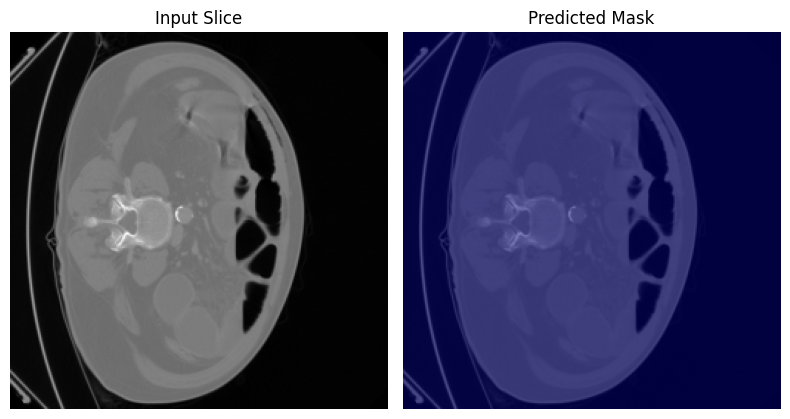

Đã lưu kết quả dự đoán cho test-volume-24.nii tại plots\pred_test-volume-24.nii.png


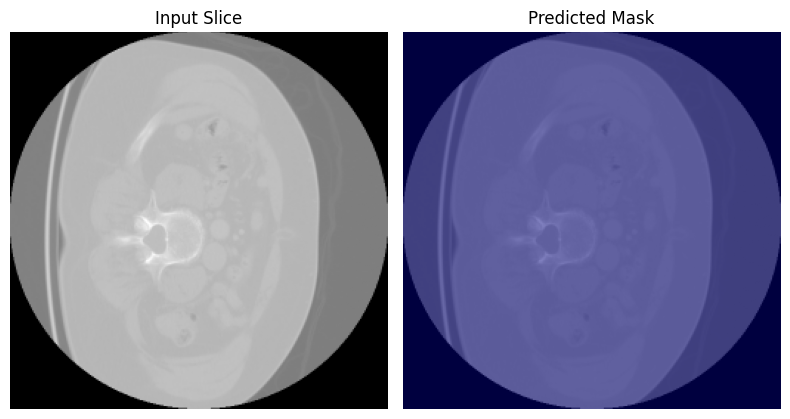

Đã lưu kết quả dự đoán cho test-volume-25.nii tại plots\pred_test-volume-25.nii.png


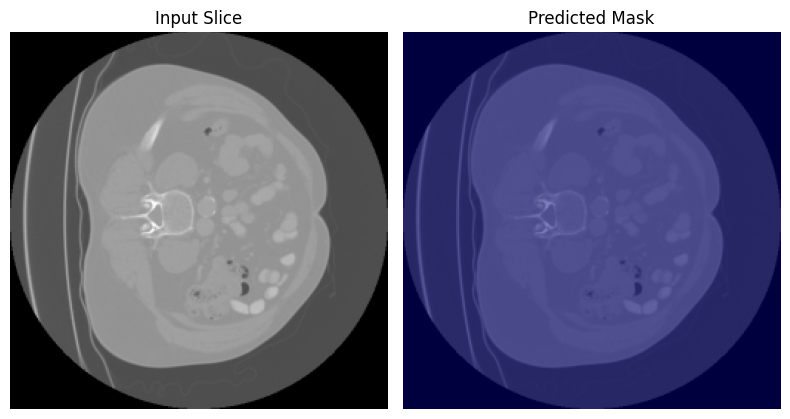

Đã lưu kết quả dự đoán cho test-volume-26.nii tại plots\pred_test-volume-26.nii.png


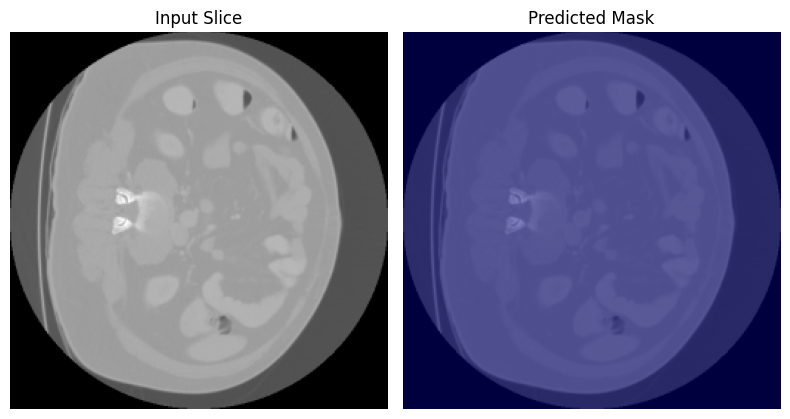

Đã lưu kết quả dự đoán cho test-volume-27.nii tại plots\pred_test-volume-27.nii.png


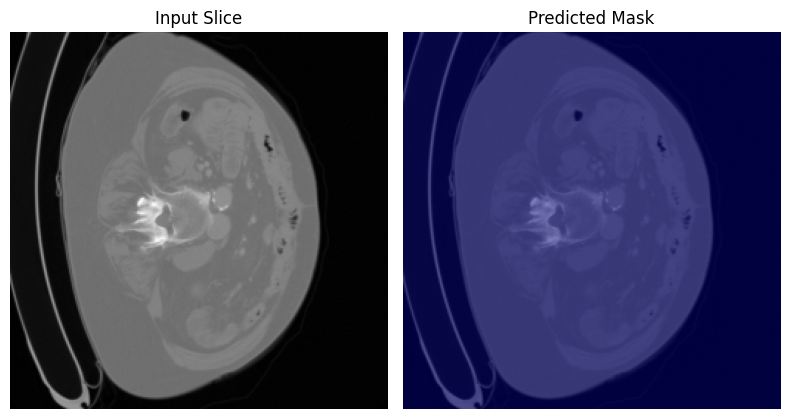

Đã lưu kết quả dự đoán cho test-volume-28.nii tại plots\pred_test-volume-28.nii.png


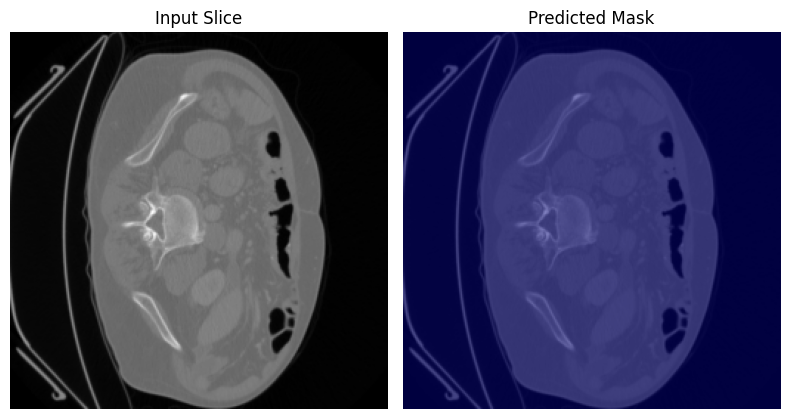

Đã lưu kết quả dự đoán cho test-volume-29.nii tại plots\pred_test-volume-29.nii.png


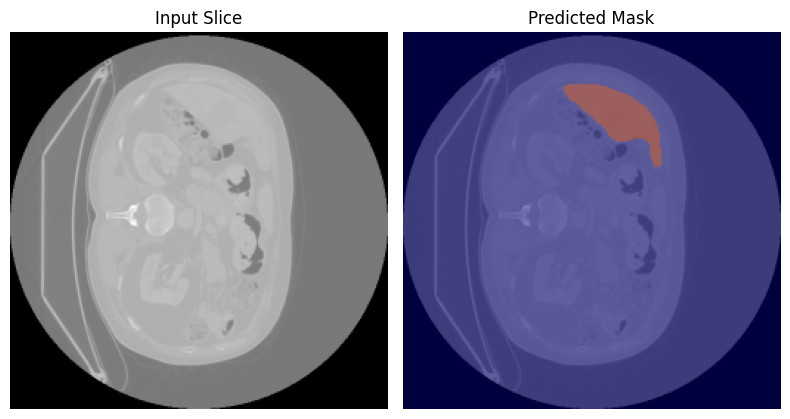

Đã lưu kết quả dự đoán cho test-volume-3.nii tại plots\pred_test-volume-3.nii.png


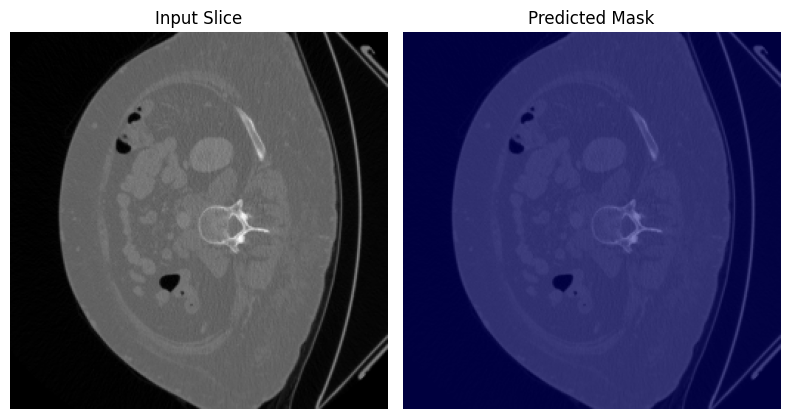

Đã lưu kết quả dự đoán cho test-volume-30.nii tại plots\pred_test-volume-30.nii.png


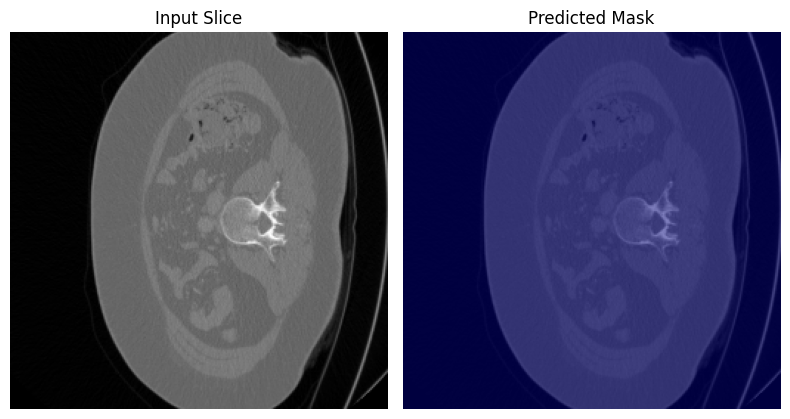

Đã lưu kết quả dự đoán cho test-volume-31.nii tại plots\pred_test-volume-31.nii.png


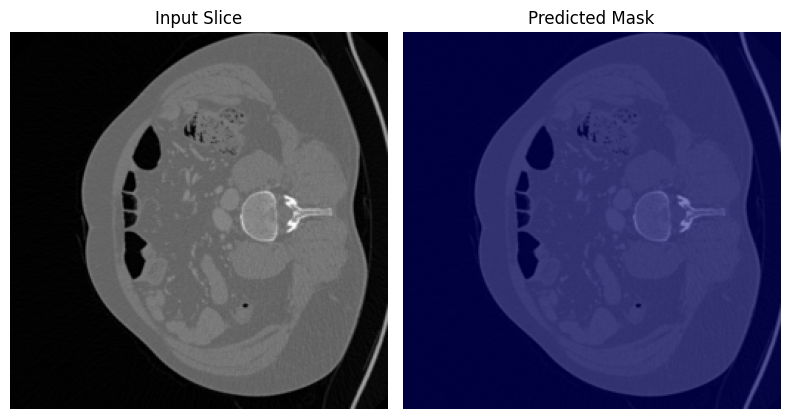

Đã lưu kết quả dự đoán cho test-volume-32.nii tại plots\pred_test-volume-32.nii.png


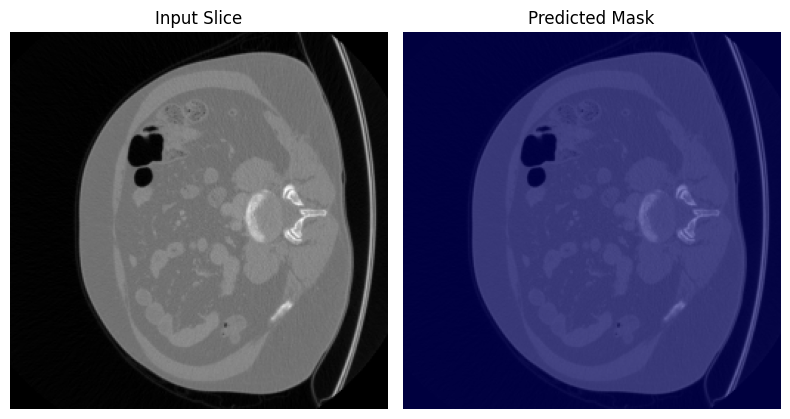

Đã lưu kết quả dự đoán cho test-volume-33.nii tại plots\pred_test-volume-33.nii.png


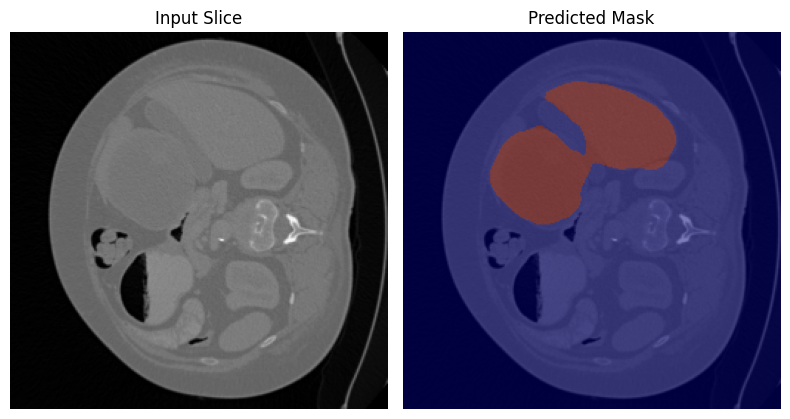

Đã lưu kết quả dự đoán cho test-volume-34.nii tại plots\pred_test-volume-34.nii.png


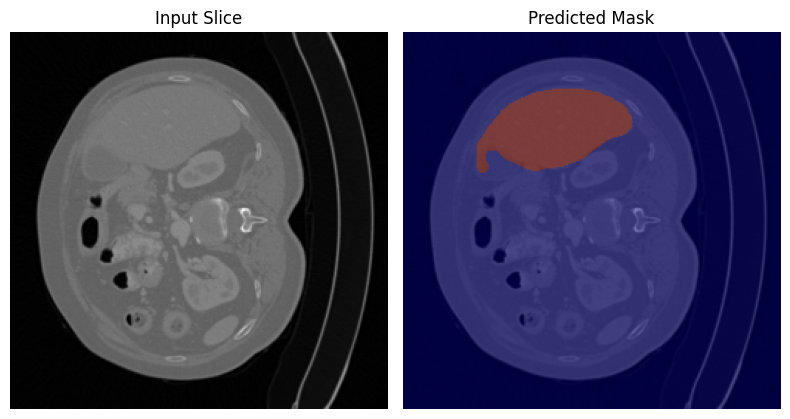

Đã lưu kết quả dự đoán cho test-volume-35.nii tại plots\pred_test-volume-35.nii.png


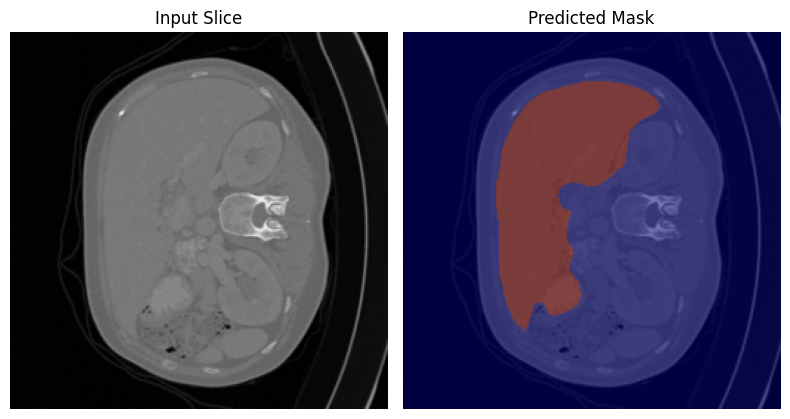

Đã lưu kết quả dự đoán cho test-volume-36.nii tại plots\pred_test-volume-36.nii.png


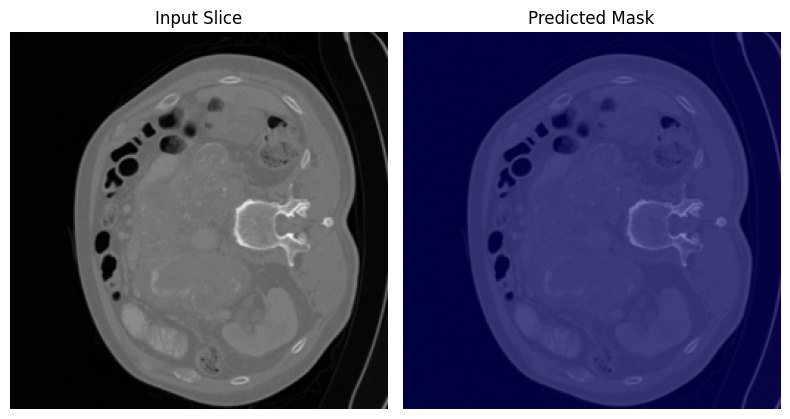

Đã lưu kết quả dự đoán cho test-volume-37.nii tại plots\pred_test-volume-37.nii.png


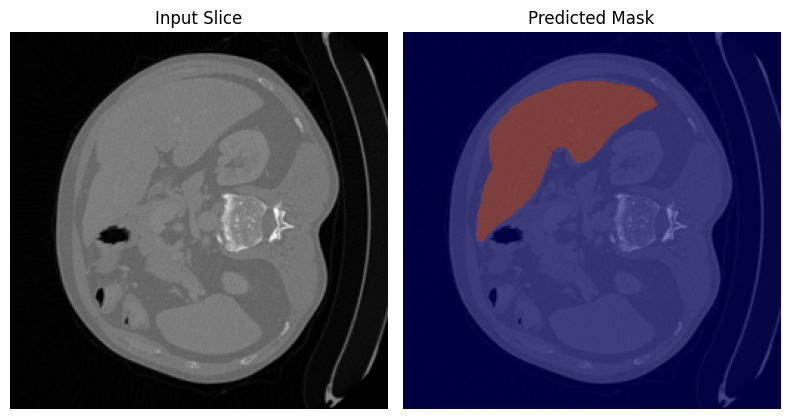

Đã lưu kết quả dự đoán cho test-volume-38.nii tại plots\pred_test-volume-38.nii.png


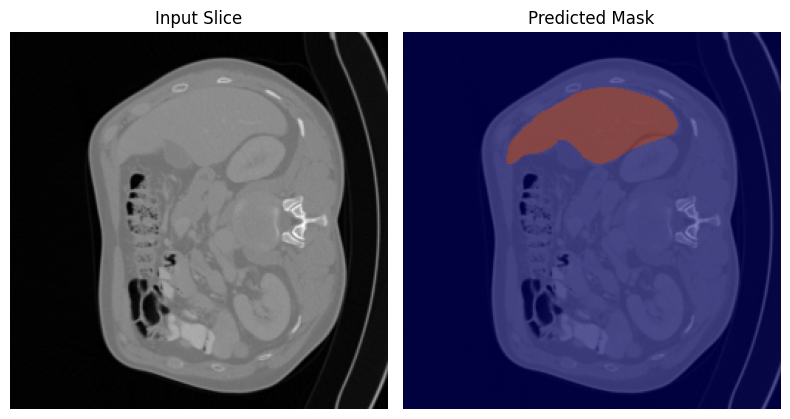

Đã lưu kết quả dự đoán cho test-volume-39.nii tại plots\pred_test-volume-39.nii.png


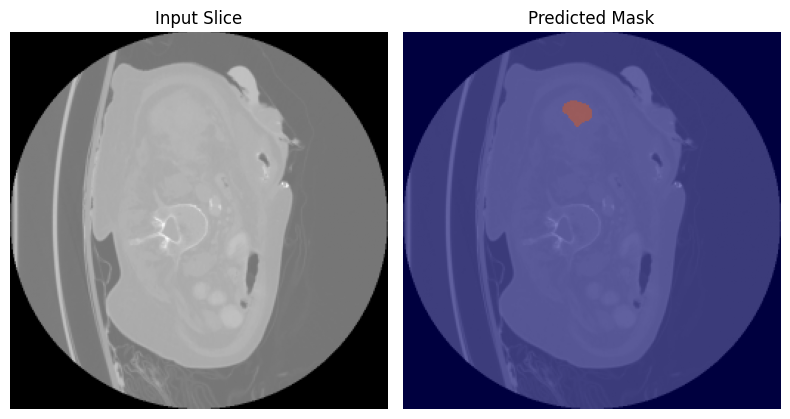

Đã lưu kết quả dự đoán cho test-volume-4.nii tại plots\pred_test-volume-4.nii.png


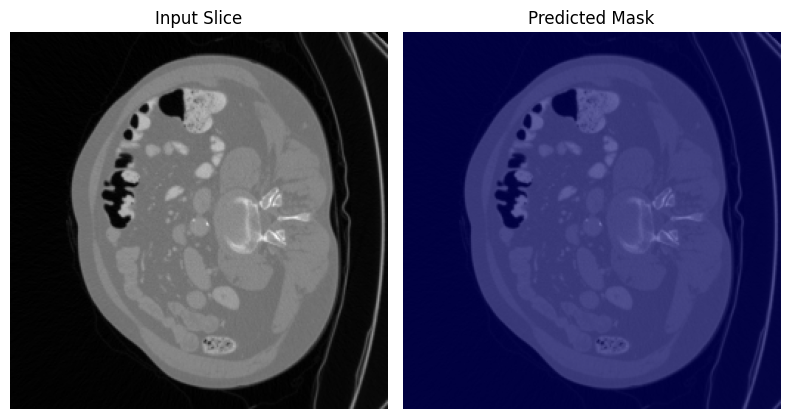

Đã lưu kết quả dự đoán cho test-volume-40.nii tại plots\pred_test-volume-40.nii.png


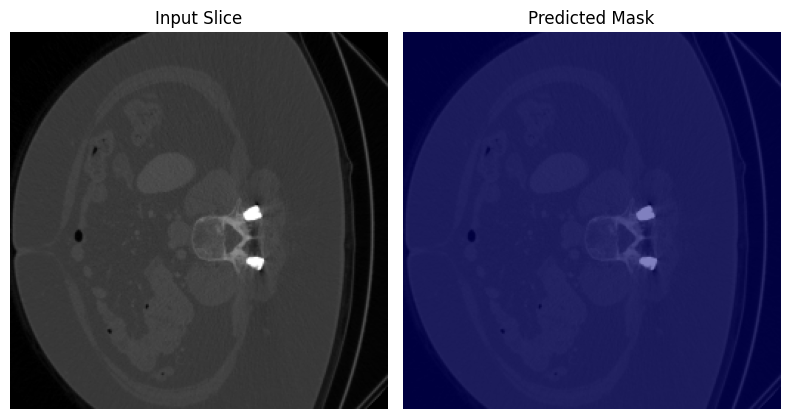

Đã lưu kết quả dự đoán cho test-volume-41.nii tại plots\pred_test-volume-41.nii.png


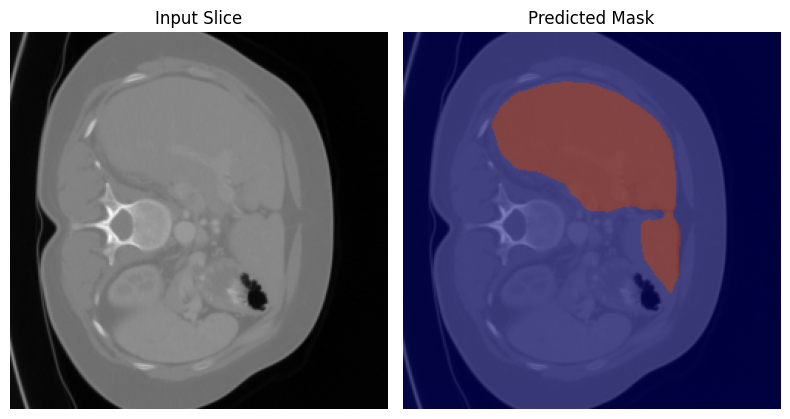

Đã lưu kết quả dự đoán cho test-volume-42.nii tại plots\pred_test-volume-42.nii.png


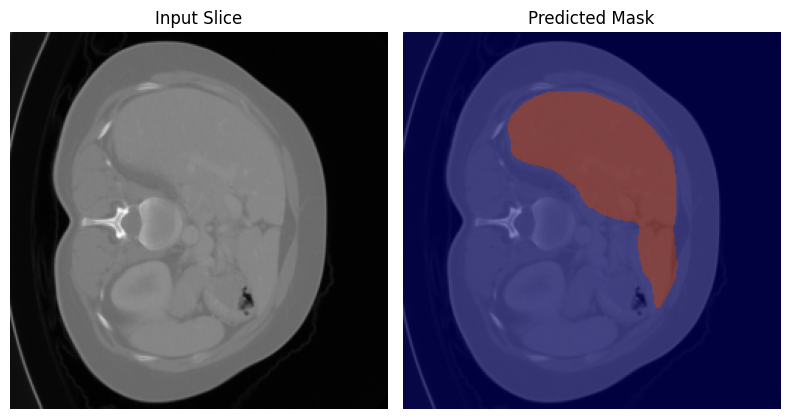

Đã lưu kết quả dự đoán cho test-volume-43.nii tại plots\pred_test-volume-43.nii.png


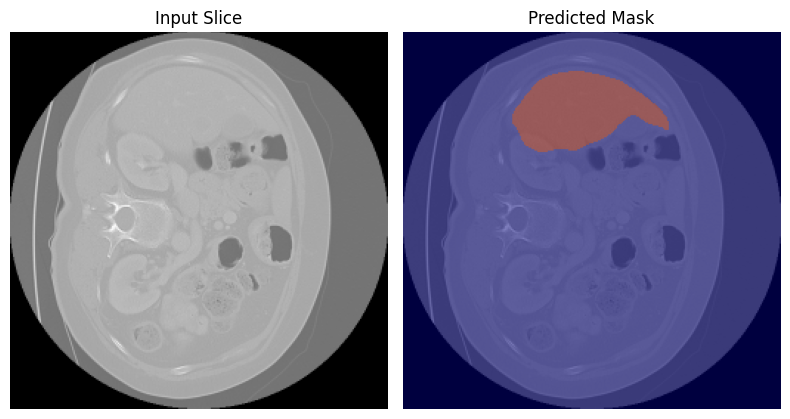

Đã lưu kết quả dự đoán cho test-volume-44.nii tại plots\pred_test-volume-44.nii.png


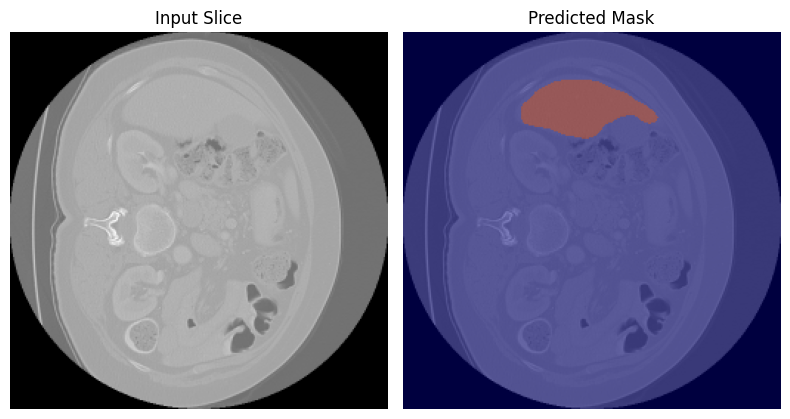

Đã lưu kết quả dự đoán cho test-volume-45.nii tại plots\pred_test-volume-45.nii.png


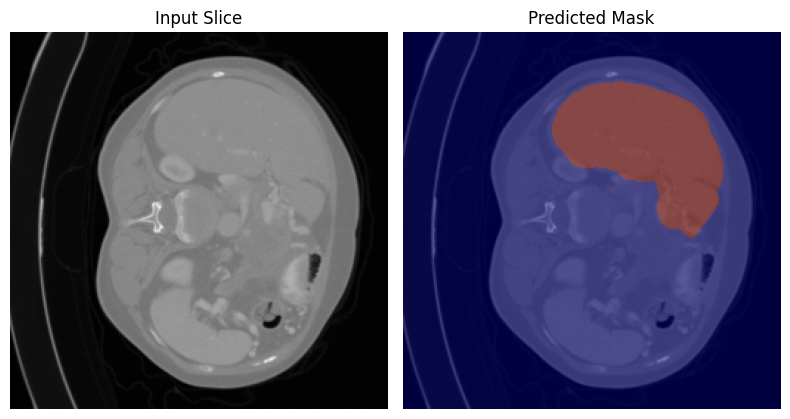

Đã lưu kết quả dự đoán cho test-volume-46.nii tại plots\pred_test-volume-46.nii.png


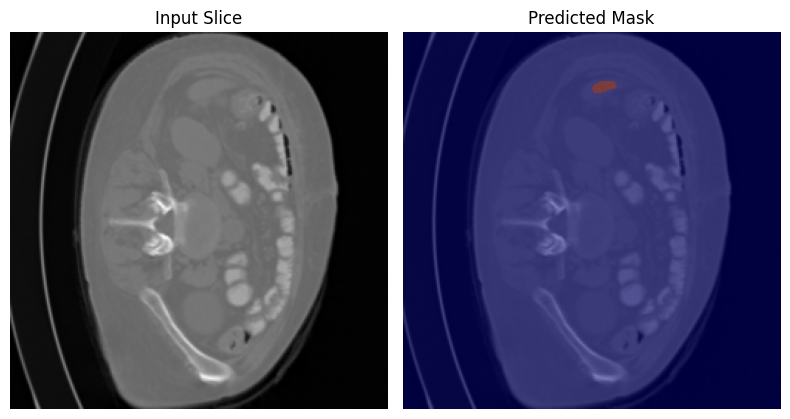

Đã lưu kết quả dự đoán cho test-volume-47.nii tại plots\pred_test-volume-47.nii.png


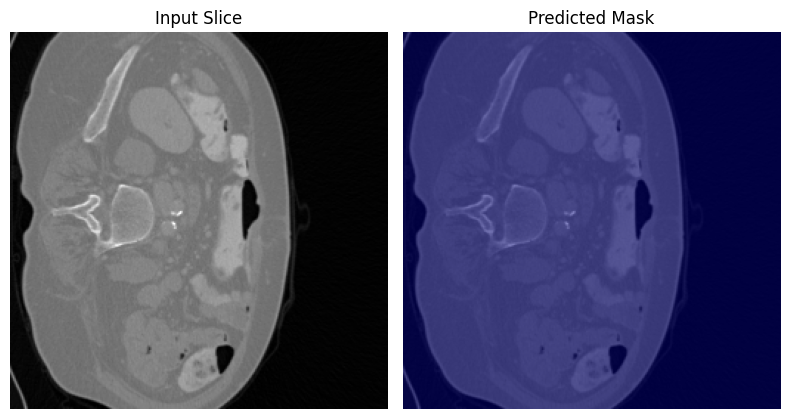

Đã lưu kết quả dự đoán cho test-volume-48.nii tại plots\pred_test-volume-48.nii.png


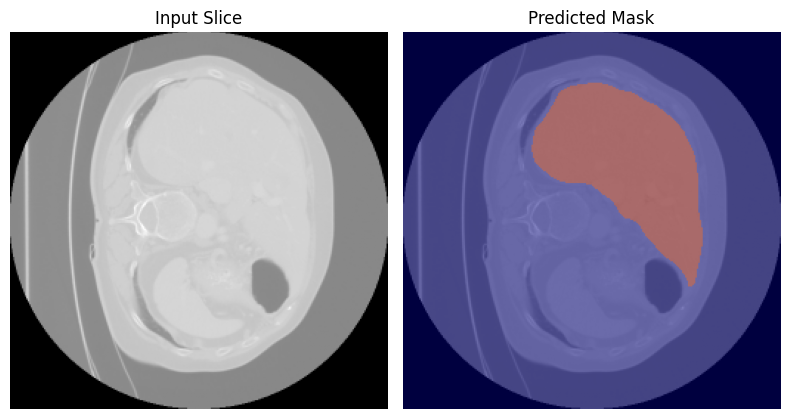

Đã lưu kết quả dự đoán cho test-volume-49.nii tại plots\pred_test-volume-49.nii.png


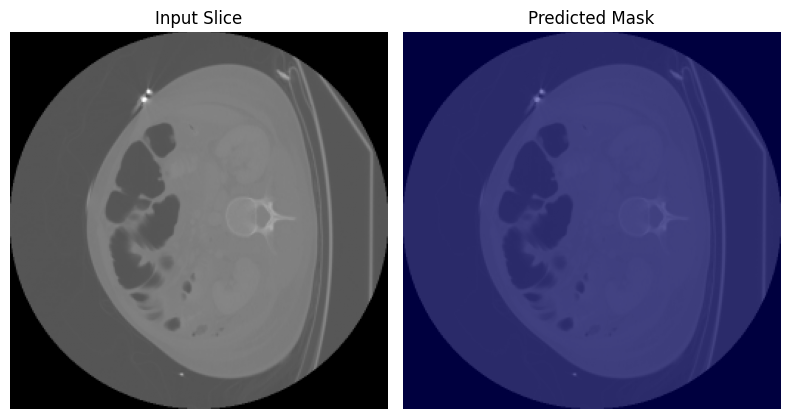

Đã lưu kết quả dự đoán cho test-volume-5.nii tại plots\pred_test-volume-5.nii.png


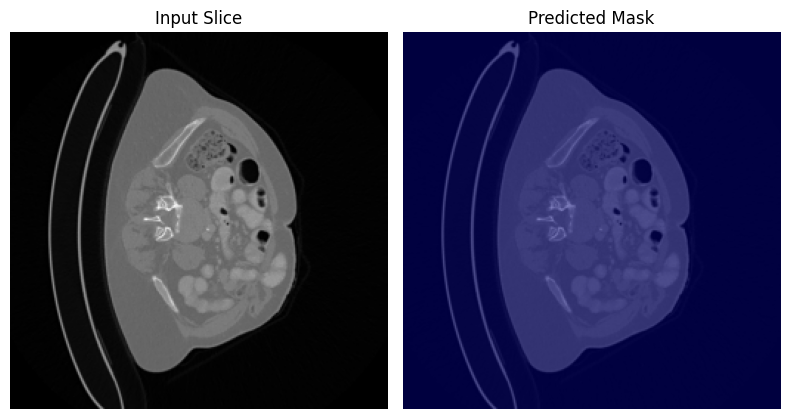

Đã lưu kết quả dự đoán cho test-volume-50.nii tại plots\pred_test-volume-50.nii.png


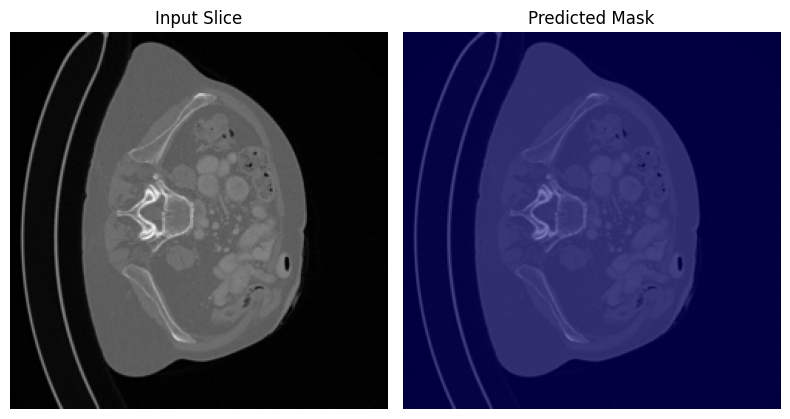

Đã lưu kết quả dự đoán cho test-volume-51.nii tại plots\pred_test-volume-51.nii.png


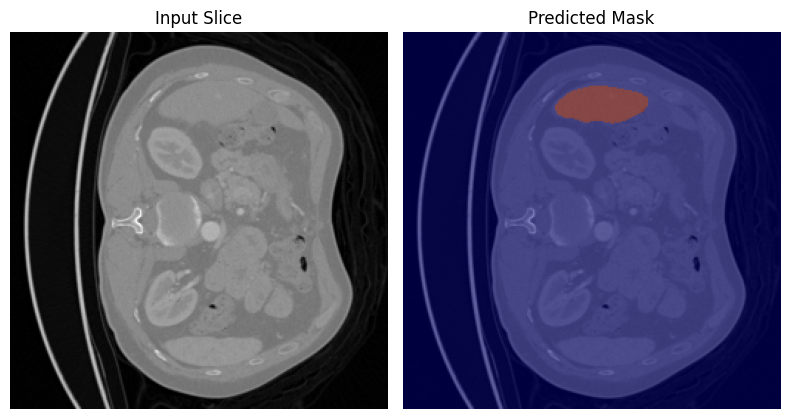

Đã lưu kết quả dự đoán cho test-volume-52.nii tại plots\pred_test-volume-52.nii.png


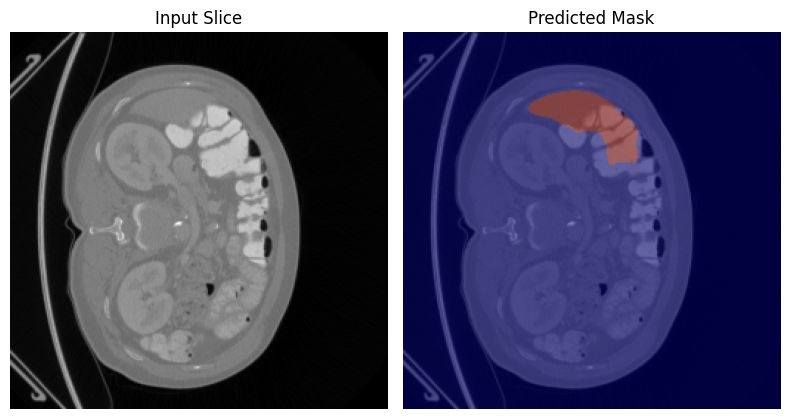

Đã lưu kết quả dự đoán cho test-volume-53.nii tại plots\pred_test-volume-53.nii.png


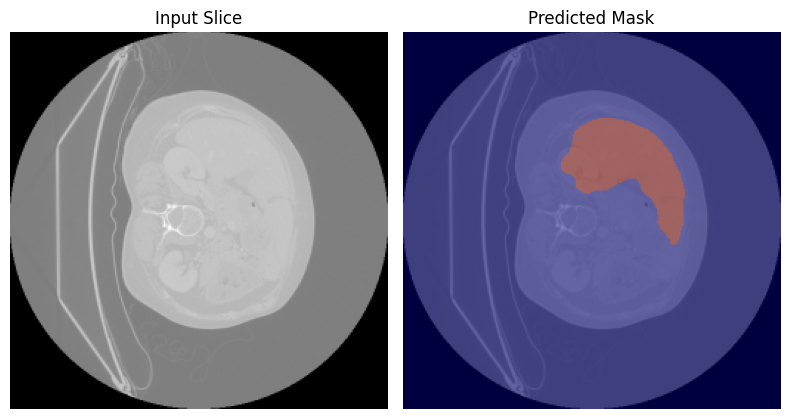

Đã lưu kết quả dự đoán cho test-volume-54.nii tại plots\pred_test-volume-54.nii.png


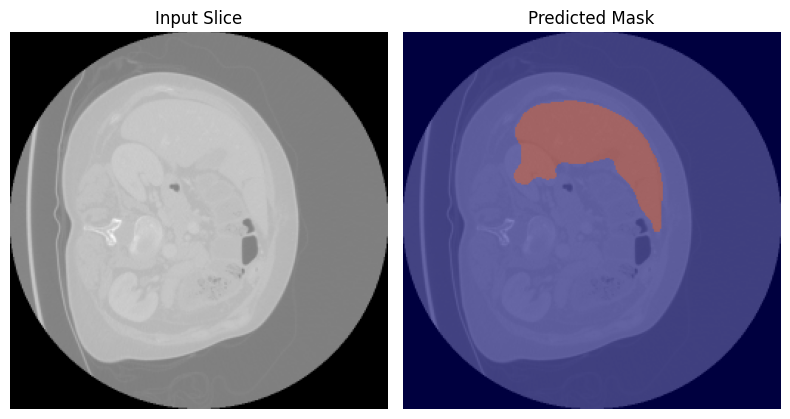

Đã lưu kết quả dự đoán cho test-volume-55.nii tại plots\pred_test-volume-55.nii.png


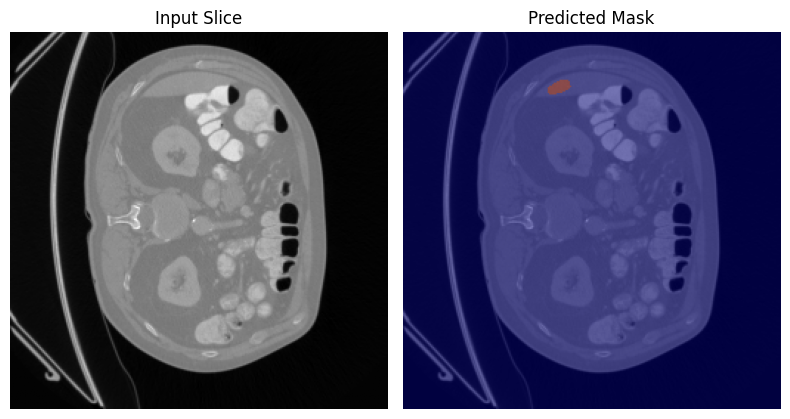

Đã lưu kết quả dự đoán cho test-volume-56.nii tại plots\pred_test-volume-56.nii.png


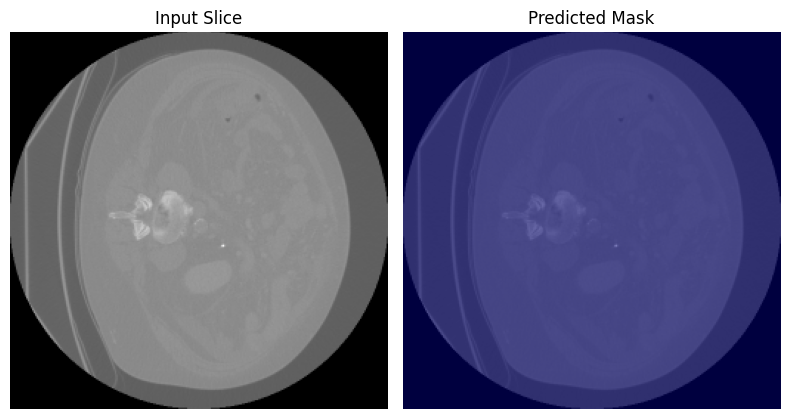

Đã lưu kết quả dự đoán cho test-volume-57.nii tại plots\pred_test-volume-57.nii.png


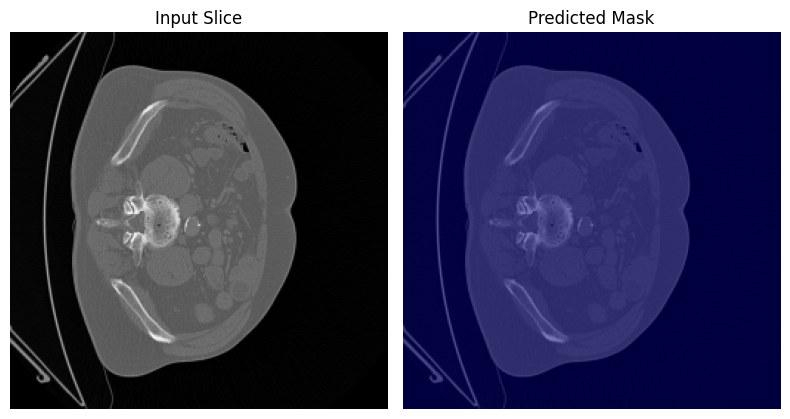

Đã lưu kết quả dự đoán cho test-volume-58.nii tại plots\pred_test-volume-58.nii.png


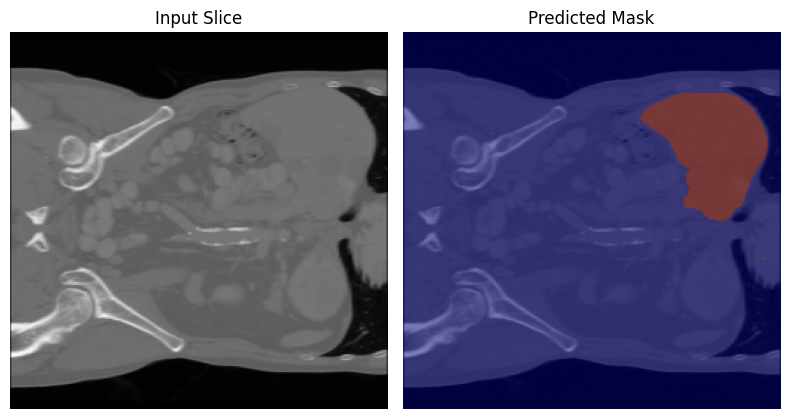

Đã lưu kết quả dự đoán cho test-volume-59.nii tại plots\pred_test-volume-59.nii.png


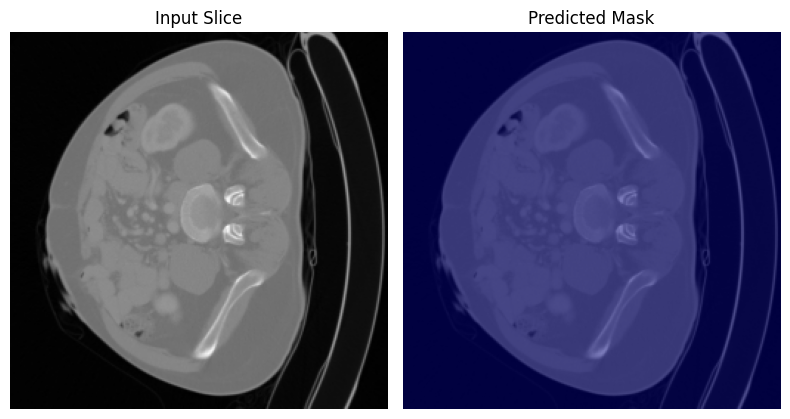

Đã lưu kết quả dự đoán cho test-volume-6.nii tại plots\pred_test-volume-6.nii.png


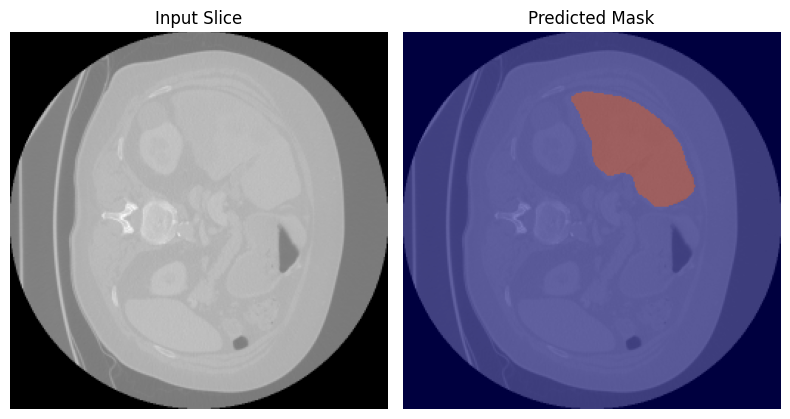

Đã lưu kết quả dự đoán cho test-volume-60.nii tại plots\pred_test-volume-60.nii.png


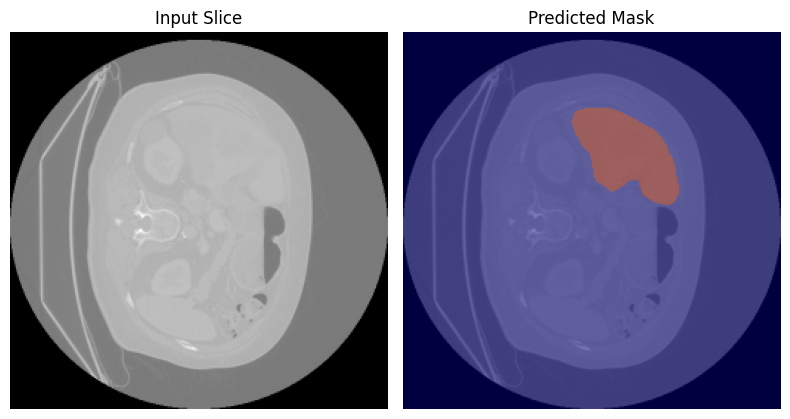

Đã lưu kết quả dự đoán cho test-volume-61.nii tại plots\pred_test-volume-61.nii.png


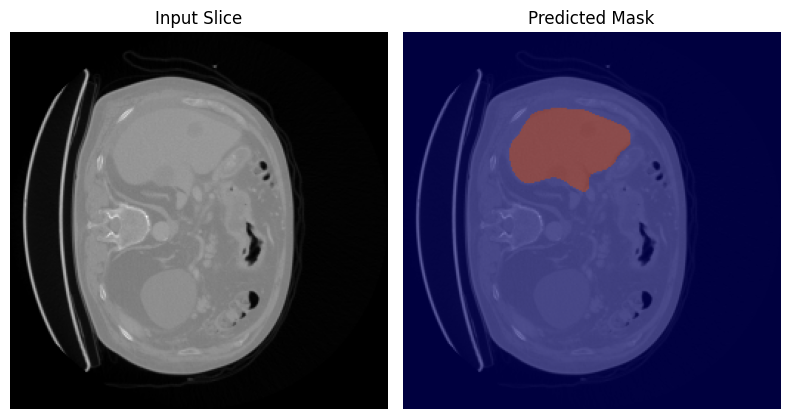

Đã lưu kết quả dự đoán cho test-volume-62.nii tại plots\pred_test-volume-62.nii.png


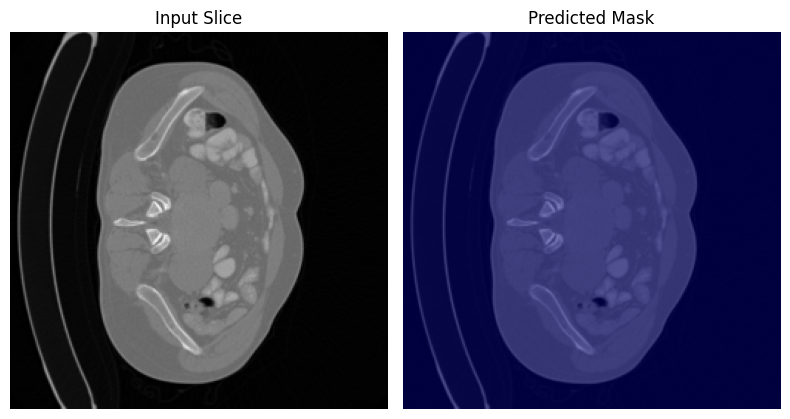

Đã lưu kết quả dự đoán cho test-volume-63.nii tại plots\pred_test-volume-63.nii.png


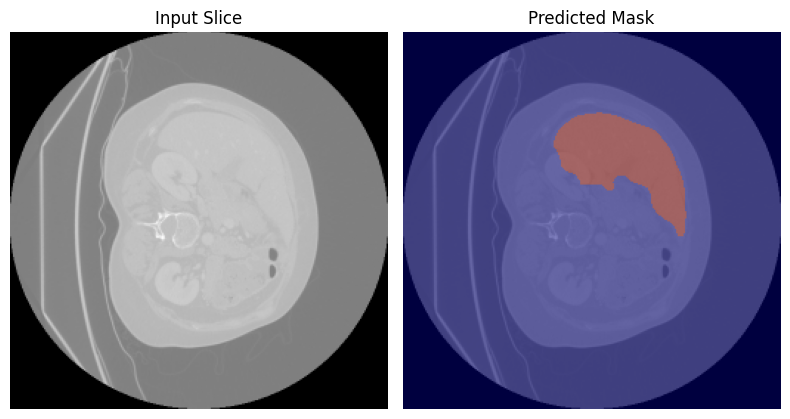

Đã lưu kết quả dự đoán cho test-volume-64.nii tại plots\pred_test-volume-64.nii.png


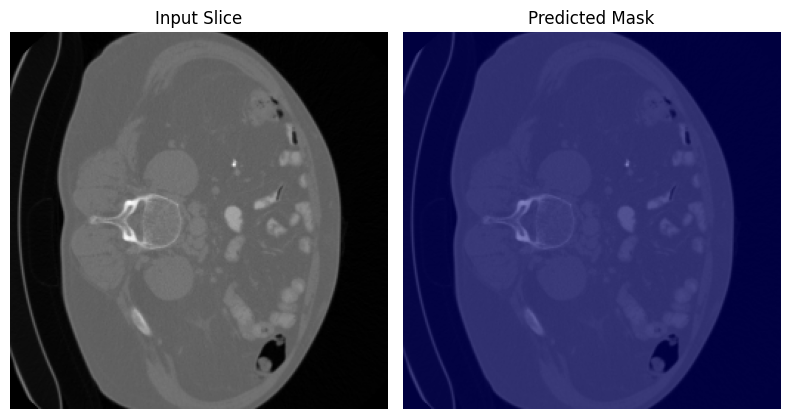

Đã lưu kết quả dự đoán cho test-volume-65.nii tại plots\pred_test-volume-65.nii.png


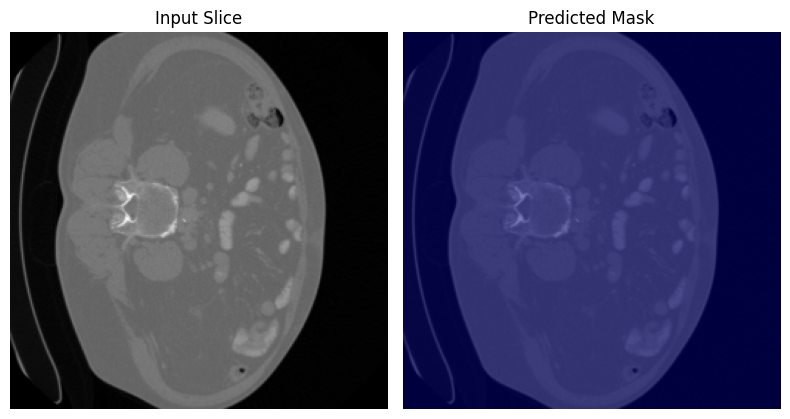

Đã lưu kết quả dự đoán cho test-volume-66.nii tại plots\pred_test-volume-66.nii.png


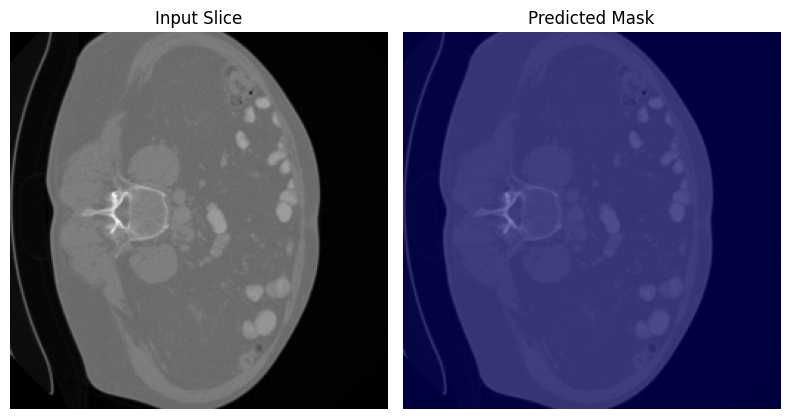

Đã lưu kết quả dự đoán cho test-volume-67.nii tại plots\pred_test-volume-67.nii.png


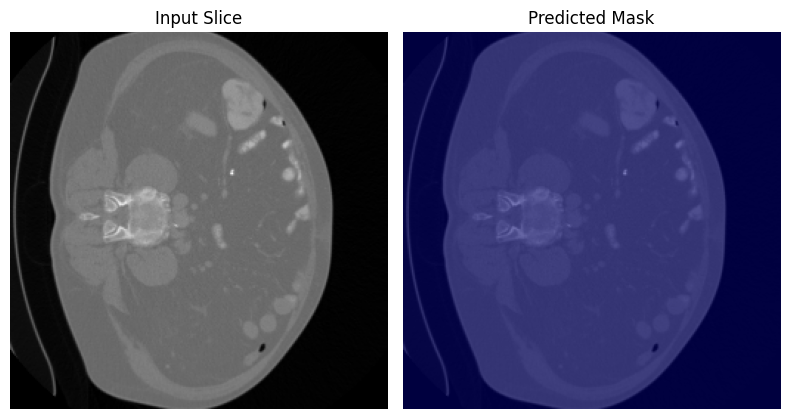

Đã lưu kết quả dự đoán cho test-volume-68.nii tại plots\pred_test-volume-68.nii.png


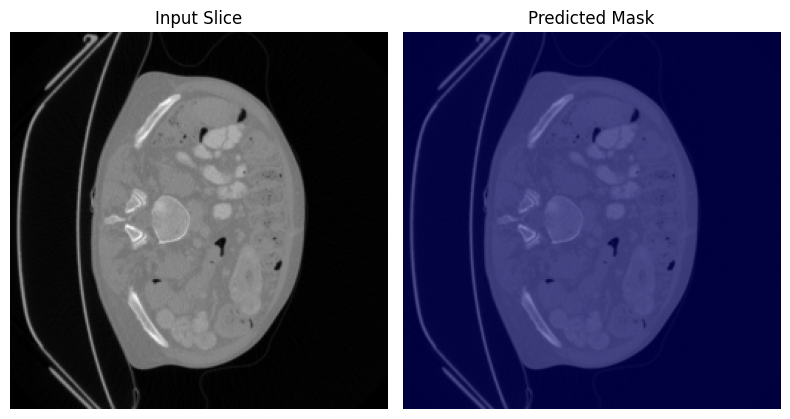

Đã lưu kết quả dự đoán cho test-volume-69.nii tại plots\pred_test-volume-69.nii.png


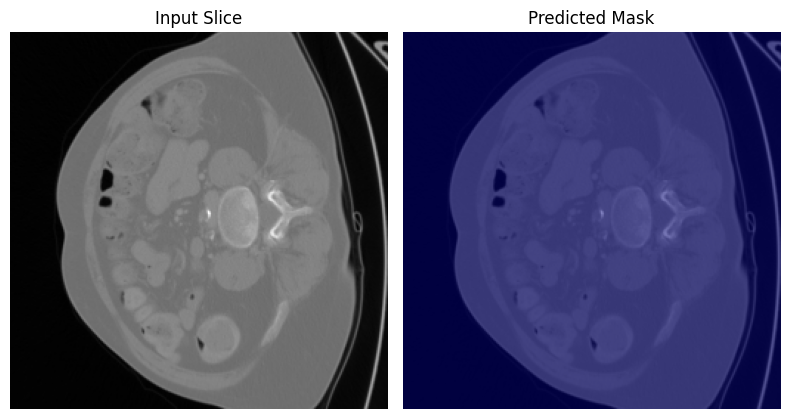

Đã lưu kết quả dự đoán cho test-volume-7.nii tại plots\pred_test-volume-7.nii.png


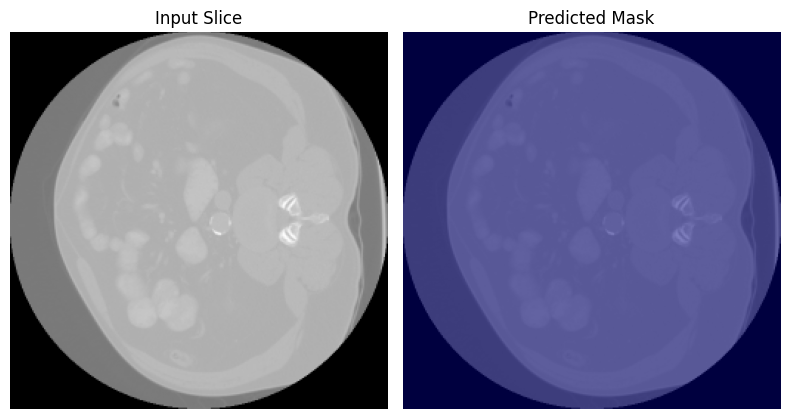

Đã lưu kết quả dự đoán cho test-volume-8.nii tại plots\pred_test-volume-8.nii.png


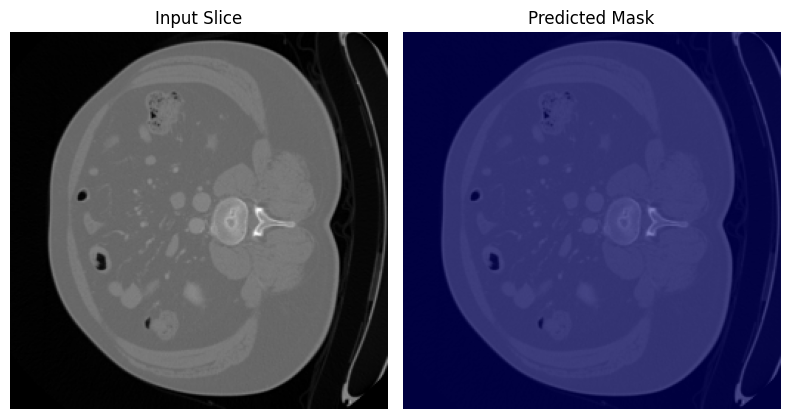

Đã lưu kết quả dự đoán cho test-volume-9.nii tại plots\pred_test-volume-9.nii.png


In [1]:
import os
import torch
import torch.nn as nn
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import timm
import cv2  # Dùng để resize ảnh
import torch.nn.functional as F

# Kiến trúc cải tiến giống training
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

class UpBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super(UpBlock, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_block = ConvBlock(in_channels + skip_channels, out_channels)
    def forward(self, x, skip):
        x = self.up(x)
        if x.shape[2:] != skip.shape[2:]:
            x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, skip], dim=1)
        return self.conv_block(x)

class PVT_LiverSegImproved(nn.Module):
    def __init__(self, backbone_name="pvt_v2_b2", num_classes=1):
        super(PVT_LiverSegImproved, self).__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=True, features_only=True)
        self.encoder_channels = [feat['num_chs'] for feat in self.backbone.feature_info][-3:]
        
        self.center = ConvBlock(self.encoder_channels[2], 256)
        self.up1 = UpBlock(256, self.encoder_channels[1], 128)
        self.up2 = UpBlock(128, self.encoder_channels[0], 64)
        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.out_conv = nn.Conv2d(64, num_classes, kernel_size=1)
        
    def forward(self, x):
        B, C, H, W = x.shape
        if C == 1:
            x = x.repeat(1, 3, 1, 1)
        
        features = self.backbone(x)
        # Lấy 3 tầng cuối từ backbone
        f1 = features[-3]  # độ phân giải cao
        f2 = features[-2]
        f3 = features[-1]  # độ phân giải thấp, đặc trưng mạnh
        
        center = self.center(f3)
        d1 = self.up1(center, f2)
        d2 = self.up2(d1, f1)
        d3 = self.up3(d2)
        out = self.out_conv(d3)
        out = F.interpolate(out, size=(H, W), mode='bilinear', align_corners=False)
        return out

def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # 1. Load model cải tiến
    model = PVT_LiverSegImproved(backbone_name="pvt_v2_b2", num_classes=1).to(device)
    model.load_state_dict(torch.load("weights/pvt_liver_seg_preprocess.pth", map_location=device))  
    model.eval()
    
    # 2. Folder test
    test_root = "taskliver_03/test"
    volume_files = sorted([
        f for f in os.listdir(test_root)
        if f.startswith("test-volume-") and f.endswith(".nii")
    ])
    
    os.makedirs("plots", exist_ok=True)
    
    for vol_file in volume_files:
        volume_path = os.path.join(test_root, vol_file)
        volume_nib = nib.load(volume_path)
        volume_data = volume_nib.get_fdata().astype(np.float32)
        
        mid_slice = volume_data.shape[2] // 2
        image_2d = volume_data[:, :, mid_slice]
        
        image_resized = cv2.resize(image_2d, (256, 256), interpolation=cv2.INTER_LINEAR)
        image_tensor = torch.from_numpy(image_resized).unsqueeze(0).unsqueeze(0).to(device)
        
        with torch.no_grad():
            pred = model(image_tensor)
            pred_sigmoid = torch.sigmoid(pred)
            pred_mask = (pred_sigmoid > 0.5).float().cpu().numpy()[0, 0]
        
        plt.figure(figsize=(8,6))
        plt.subplot(1, 2, 1)
        plt.imshow(image_resized, cmap='gray', aspect='equal')
        plt.title("Input Slice")
        plt.axis("off")
        
        plt.subplot(1, 2, 2)
        plt.imshow(image_resized, cmap='gray', aspect='equal')
        plt.imshow(pred_mask, alpha=0.5, cmap='jet')
        plt.title("Predicted Mask")
        plt.axis("off")
        
        save_path = os.path.join("plots", f"pred_{vol_file}.png")
        plt.tight_layout()
        plt.savefig(save_path, bbox_inches='tight')
        plt.show()
        
        print(f"Đã lưu kết quả dự đoán cho {vol_file} tại {save_path}")

if __name__ == "__main__":
    main()
